# Something to think on:
* id values:
    - Why some of the id's have small number of values?
    - Is the number of ids are equal to each latitude-longitude unique pair? If not why?
* rel_humidity:
    - Why there are peaks at 5's multipliers?
    - Is it rounding (to closer %5's multiplier percentage value)?
    - Are the peaks caused by censor sensitivity (measuring quality of censors)?
* Why there is a strong negative correlation (-1) between latitude and longitude?
* Does strong negative correlation between rel_humidity and temp_celcius values mean anything to us?
* temp_celcius distribution looks like a Gaussian distribution. Is it useful information?
* What is movement? We need detailed information about it.
    - Why most of the values have 0 movement but few of them have positive integer values?
* Latitude and Longitude are floats, we might need an implemention of conversion between decimal coordinates and hour-minute-second-degree notation.
* Gather measurements from most measured censors. Compare them to weather data from NOAA?
* Heatmap on temperatures?
  
Solved: Can there be a way to automatically plot the map corresponding to plotted latitude and longitude values?  
Solved: What is the timestamp?  
Achievable now: Get the n days of temp and humidity** Is global warming observable from data (if data is provided for some years)?

In [2]:
#Libraries used in the project
import numpy as np
import scipy as sc
import pandas as pd #to import data
import matplotlib.pyplot as plt #to plot data
import matplotlib.colors as colors
import seaborn as sns #to violinplot the distributions, pairplot the attributes
from mpl_toolkits.basemap import Basemap #to plot data on real world map
from sklearn.cluster import MiniBatchKMeans
from itertools import cycle
from datetime import datetime

C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\sklearn\utils\fixes.py:313: FutureWarning: numpy not_equal will not check object identity in the future. The comparison did not return the same result as suggested by the identity (`is`)) and will change.
  _nan_object_mask = _nan_object_array != _nan_object_array


In [3]:
# data = Original dataset in dataFrame format with header column and id attribute
data = pd.read_csv("data/SensorTablePartial.csv")
# d = data in numpy array format
d = np.asarray(data)
# permuteddata = d permuted in numpy array format
permuteddata = np.random.permutation(d)
#First 5 elements of the data
data.head()

,id,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
0,00SUN1,1522196702,16.3,20.0,38.816743,-107.782709,0
1,00SUN1,1522196852,16.0,21.5,38.816743,-107.782709,0
2,00SUN1,1522197002,16.1,20.5,38.816743,-107.782709,0
3,00SUN1,1522197152,16.2,20.5,38.816743,-107.782709,0
4,E7Y1NM,1522196898,11.9,30.0,38.816330,-107.793882,0


In [3]:
#Last 5 elements of the data
data.tail()

,id,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
836663,GNMCD5,1525812612,31.6,16.0,39.073931,-108.410991,0
836664,GNMCD5,1525812762,31.9,13.5,39.073931,-108.410991,0
836665,OZTUJH,1525812344,38.1,8.0,39.096057,-108.364281,0
836666,OZTUJH,1525812494,38.8,8.0,39.096057,-108.364281,0
836667,OZTUJH,1525812644,39.4,8.0,39.096057,-108.364281,0


In [4]:
#Dataset Shape (Number of datapoints, number of attributes for each datapoint)
d.shape

(836668, 7)

In [5]:
#Empty lists for each unique value and count of that value
aa, bb = [], []
#Gathering values and quantity
for i in range(d.shape[1]):
    a,b = np.unique(d[:,i], return_counts=True)
    aa.append(a)
    bb.append(b)
    print("Unique values in %s column: %s" % (data.columns.tolist()[i], len(b)))

Unique values in id column: 127
Unique values in timestamp column: 701113
Unique values in temp_celsius column: 664
Unique values in rel_humidity column: 201
Unique values in latitude column: 89
Unique values in longitude column: 89
Unique values in movement column: 5


In [6]:
#Deleting the timstamp column (Impossible to plot 701113 unique values)
del aa[1]
del bb[1]
data2 = data
data2= data2.drop(columns="timestamp")

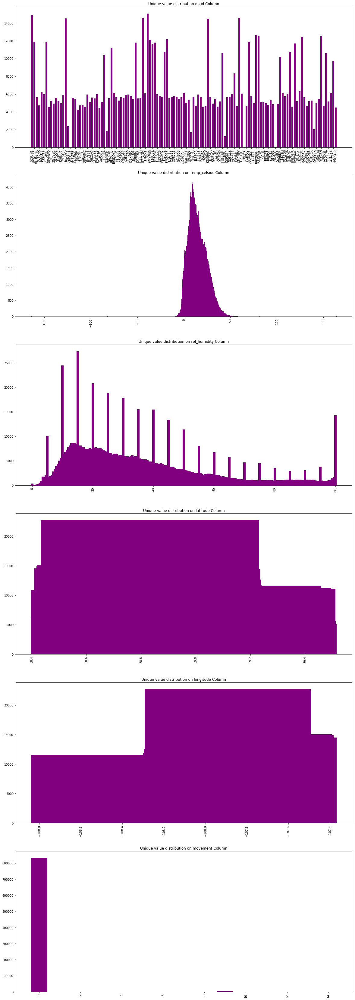

In [7]:
#Plotting unique values for each data attribute (except timestamp)
#6 subplots with 1 plot for each row.
fig, ax = plt.subplots(6, 1, figsize=(20,60))
ax.ravel()
for i in range(6):
    np.max(bb[i])
    #Get data attribute header
    ax[i].set_title("Unique value distribution on %s Column" %data2.columns.tolist()[i] )
    #Using bar function to plot results on a bar chart
    ax[i].bar(aa[i], bb[i], color="purple")
#Rotate x-axis labels for readability
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90)  
plt.show()

In [8]:
#Show unique values - Movement column only (other columns have large scale)
print("Unique values and their amount for %s column:" % data2.columns.tolist()[5])
print("%-6s" % aa[5])
print("%-6s" % bb[5])

Unique values and their amount for movement column:
[0 9 10 13 14]
[832346   3399    786      1    136]


In [9]:
#Data values
'''
Counts are same for each attribute, there's no missing field in the dataset.
'''
data.describe()

,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
count,8.366680e+05,836668.000000,836668.000000,836668.000000,836668.000000,836668.000000
mean,1.524454e+09,14.796983,36.171917,38.909663,-108.013254,0.048249
std,9.186144e+05,9.761613,23.701154,0.124981,0.277721,0.672863
min,1.522197e+09,-163.900000,0.000000,38.796464,-108.440651,0.000000
25%,1.523637e+09,7.500000,17.500000,38.814443,-108.366633,0.000000
50%,1.524675e+09,13.400000,30.000000,38.833719,-107.893285,0.000000
75%,1.525242e+09,21.400000,48.500000,39.059508,-107.780718,0.000000
max,1.525813e+09,163.800000,100.000000,39.115519,-107.767600,14.000000


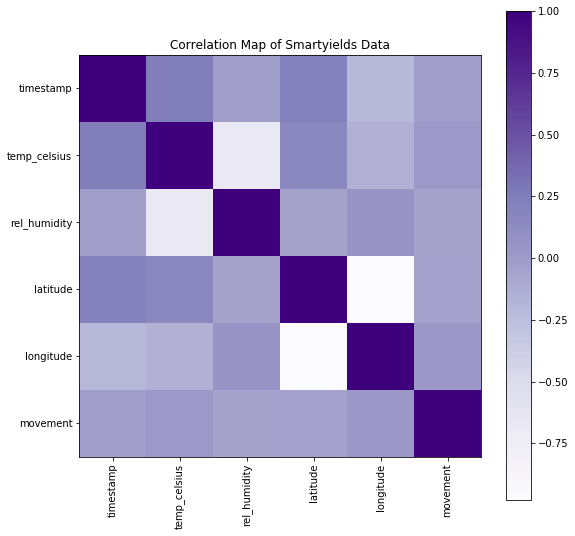

In [10]:
def plot_corr(df,size=8):
    corr = df.iloc[:,1:size].corr()
    fig, ax = plt.subplots(figsize=(9, 9))
    ax.tick_params(axis="x", labelrotation=90)
    plt.title("Correlation Map of Smartyields Data")
    plt.imshow(corr, cmap=plt.cm.Purples, interpolation="nearest")
    plt.colorbar()
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);
    
plot_corr(data, size=11)

In [11]:
#Correlation
dcorr = data.corr()
dcorr

,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
timestamp,1.000000,0.248423,-0.025491,0.217523,-0.212495,-0.018821
temp_celsius,0.248423,1.000000,-0.678213,0.161122,-0.158742,0.023114
rel_humidity,-0.025491,-0.678213,1.000000,-0.050519,0.053996,-0.046255
latitude,0.217523,0.161122,-0.050519,1.000000,-0.981003,-0.038943
longitude,-0.212495,-0.158742,0.053996,-0.981003,1.000000,0.028599
movement,-0.018821,0.023114,-0.046255,-0.038943,0.028599,1.000000


In [16]:
#Finding the maximum values of Latitude and Longitude
lat_max = data['latitude'].max()
lat_min = data['latitude'].min()
lon_max = data['longitude'].max()
lon_min = data['longitude'].min()
print("Latitude max & min: %.6f , %.6f" % (lat_max, lat_min))
print("Longitude max & min: %.6f , %.6f" % (lon_max, lon_min))
lat_dist = np.absolute(lat_max - lat_min)
lon_dist = np.absolute(lon_max - lon_min)
print("Distance Latitude: %.6f , Longitude: %.6f" % (lat_dist, lon_dist))
lat_dist_m = (lat_dist + 0.1) * 111000
lon_dist_m = (lon_dist + 0.1) * 111000
print("Distance METERs Latitude: %.6f , Longitude: %.6f" % (lat_dist_m, lon_dist_m))
lat_cent = lat_min + lat_dist/2
lon_cent = lon_min + lon_dist/2
print("Center values for mapping Latitude: %.6f , Longitude: %.6f" % (lat_cent, lon_cent))
lat_st = lat_min - 0.1
lat_en = lat_max + 0.1
lon_st = lon_min - 0.1
lon_en = lon_max + 0.1

Latitude max & min: 39.115519 , 38.796464
Longitude max & min: -107.767600 , -108.440651
Distance Latitude: 0.319055 , Longitude: 0.673051
Distance METERs Latitude: 46515.105000 , Longitude: 85808.661000
Center values for mapping Latitude: 38.955991 , Longitude: -108.104126


In [17]:
#Get ticks for each 0.1 degree difference with 'np.around' check
lat_st = np.around(lat_min - 0.05, decimals=1) if lat_st > lat_min else np.around(lat_min, decimals=1)
lat_en = np.around(lat_max + 0.05, decimals=1) if lat_en < lat_max else np.around(lat_max, decimals=1)
lon_st = np.around(lon_min - 0.05, decimals=1) if lon_st > lon_min else np.around(lon_min, decimals=1)
lon_en = np.around(lon_max + 0.05, decimals=1) if lon_en < lon_max else np.around(lon_max, decimals=1)
#Assign spacing to values and create a ticks list for plot
lat_ticks = np.linspace((lat_st - 0.1), (lat_en + 0.1), (np.around(lat_en-lat_st, decimals=1)*10+3))
lon_ticks = np.linspace((lon_st - 0.1), (lon_en + 0.1), (np.around(lon_en-lon_st, decimals=1)*10+3))
print("Latitude start - end points: %.1f, %.1f" % (lat_st, lat_en))
print("Longitude start - end points: %.1f, %.1f" % (lon_st, lon_en))

Latitude start - end points: 38.8, 39.1
Longitude start - end points: -108.4, -107.8


C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  import sys
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  


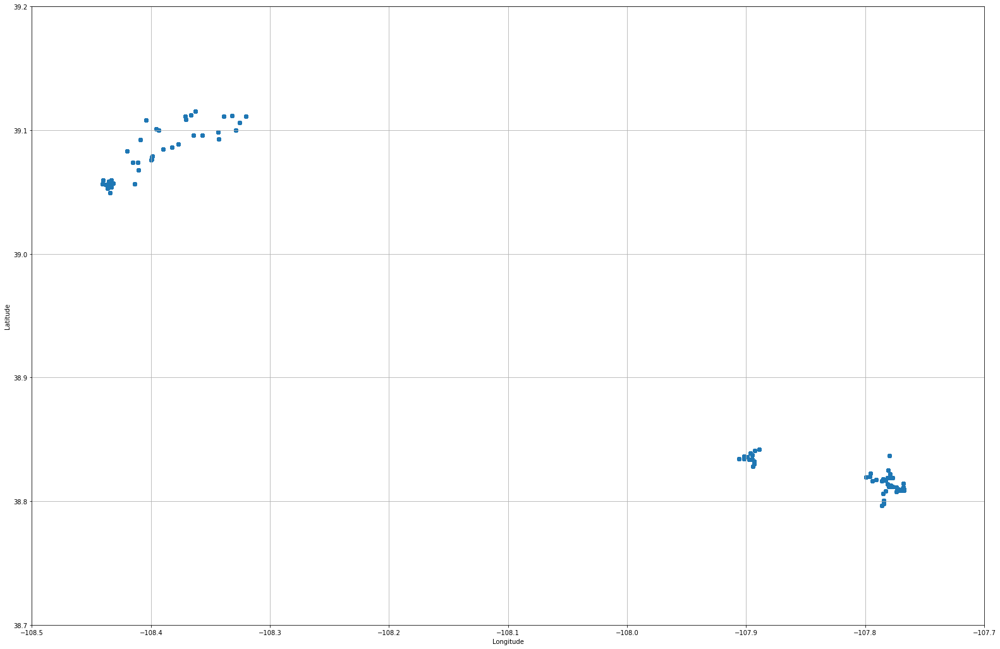

In [18]:
#Scatter points on latitude and longitude
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
plt.scatter(data["longitude"], data["latitude"])
plt.xlabel("Longitude")
plt.ylabel("Latitude")
#Use the max and mins for latitude and longitude, added some spacing
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.show()

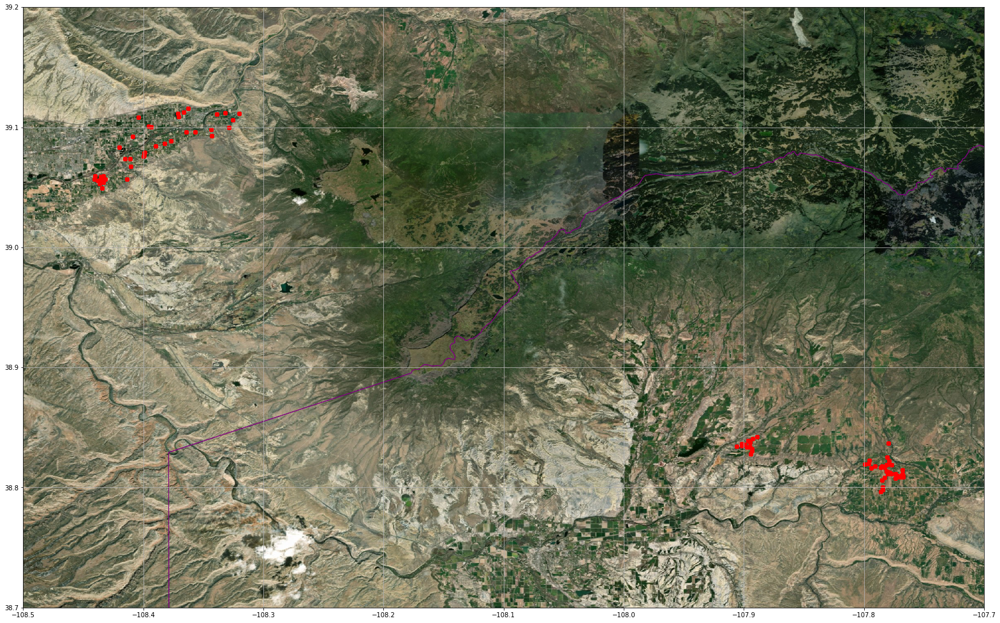

In [21]:
'''Important information about basemap
@llcrnrlon, @urcrnrlon  : Degree value for LOW - LEFT and UP - RIGHT CORNER longitude of the map. Assigned above.
@llcrnrlat, @llcrnrlat  : Degree value for LOW - LEFT and UP - RIGHT CORNER latitude of the map. Assigned above.
@projection     : Type of projection to be used, cylindric method used.
@resolution     : Quality of background images.
@epsg           : Background picture epsg code. 4269 is for United States.
Arcgisimage
@service : High quality map provider to use.
@verbose : Print Map server information when True.
@dpi     : Dot per inch, resolution quality.
@xpixels : Number of pixels on x axis of the map image.
'''
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
#Draw the map with given latitude and longitude values, used cylindric projection in this - 'cyl'
m = Basemap(projection='cyl', resolution='i', llcrnrlon=lon_st - 0.1, urcrnrlon=lon_en + 0.1, llcrnrlat=lat_st - 0.1, urcrnrlat=lat_en + 0.1 , epsg=4269)
#Arcgisimage is used for a high resolution map
m.arcgisimage(service = 'World_Imagery', xpixels = 3500, dpi=500, verbose=False)
#Other details on the map
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawcounties(color='purple', linewidth=1)
m.drawstates(color='gray')
#Convert degrees to meters (for scatter plot)
_x, _y = m(np.asarray(data['longitude']), np.asarray(data['latitude']))
m.scatter(_x, _y, color='r', alpha=0.5)
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.show()

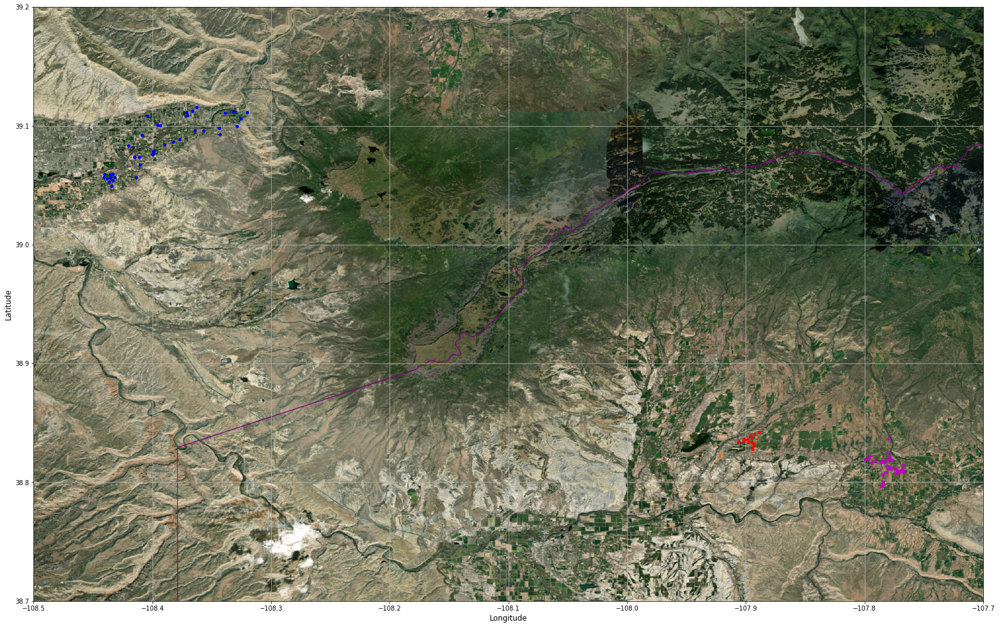

In [22]:
'''Run a clustering algorithm to group datapoints that are close geologically.
Since the number of clusters are obvious from previous plots, just used the number.
'''
#Define a mini batch K Means clustering (time efficient)
mbatch = MiniBatchKMeans(n_clusters=3, batch_size=5, n_init=10, max_no_improvement=10, verbose=0)
#Create the grid with corresponding size (latitude and longitude axis values defined above)
x, y = np.meshgrid(lon_ticks, lat_ticks)
#Seperate the geolocation data from dataframe to a list
X = data.loc[:, ['longitude', 'latitude']]
mbatch.fit(X)
ptsymb = np.array(['b.','r.','m.']) #Colors
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=lon_st - 0.1, urcrnrlon=lon_en + 0.1, llcrnrlat=lat_st - 0.1, urcrnrlat=lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'World_Imagery', xpixels = 3500, dpi=500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.ylabel('Latitude', fontsize=12)
plt.xlabel('Longitude', fontsize=12)
for i in range(3):
    #Pick every member of the corresponding (i) cluster and plot it
    cluster=np.where(mbatch.labels_==i)[0]
    plt.plot(X.longitude[cluster].values,X.latitude[cluster].values,ptsymb[i])
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.show()

In [23]:
'''This might take a while - few minutes'''
#Separating data into clusters
c1, c2, c3 = [], [], []
for i in range(len(mbatch.labels_)):
    if mbatch.labels_[i] == 0:
        c1.append(data.iloc[i])
    elif mbatch.labels_[i] == 1:
        c2.append(data.iloc[i])
    elif mbatch.labels_[i] == 2:
        c3.append(data.iloc[i])
c1a = np.asarray(c1)
c2a = np.asarray(c2)
c3a = np.asarray(c3)
print("Number of Datapoints in 1st cluster: %i " % len(c1a))
print("Number of Datapoints in 2nd cluster: %i " % len(c2a))
print("Number of Datapoints in 3rd cluster: %i " % len(c3a))

Number of Datapoints in 1st cluster: 283308 
Number of Datapoints in 2nd cluster: 179484 
Number of Datapoints in 3rd cluster: 373876 


In [25]:
'''
This part contains the calculation for the minimum and maximum longitude and latitude values
for each cluster. After finding peaks, we calculate distances and use these for drawing the grid.
'''
#Finding the maximum values of Latitude and Longitude
c1lat_max, c1lat_min, c1lon_max, c1lon_min = c1a[:,4].max(), c1a[:,4].min(), c1a[:,5].max(), c1a[:,5].min()
c2lat_max, c2lat_min, c2lon_max, c2lon_min = c2a[:,4].max(), c2a[:,4].min(), c2a[:,5].max(), c2a[:,5].min()
c3lat_max, c3lat_min, c3lon_max, c3lon_min = c3a[:,4].max(), c3a[:,4].min(), c3a[:,5].max(), c3a[:,5].min()
c1lat_st, c1lat_en, c1lon_st, c1lon_en = c1lat_min - 0.1, c1lat_max + 0.1, c1lon_min - 0.1, c1lon_max + 0.1
c2lat_st, c2lat_en, c2lon_st, c2lon_en = c2lat_min - 0.1, c2lat_max + 0.1, c2lon_min - 0.1, c2lon_max + 0.1
c3lat_st, c3lat_en, c3lon_st, c3lon_en = c3lat_min - 0.1, c3lat_max + 0.1, c3lon_min - 0.1, c3lon_max + 0.1
c1lat_st = np.around(c1lat_min - 0.05, decimals=1) if c1lat_st > c1lat_min else np.around(c1lat_min, decimals=1)
c1lat_en = np.around(c1lat_max + 0.05, decimals=1) if c1lat_en < c1lat_max else np.around(c1lat_max, decimals=1)
c1lon_st = np.around(c1lon_min - 0.05, decimals=1) if c1lon_st > c1lon_min else np.around(c1lon_min, decimals=1)
c1lon_en = np.around(c1lon_max + 0.05, decimals=1) if c1lon_en < c1lon_max else np.around(c1lon_max, decimals=1)
c1lat_ticks = np.linspace((c1lat_st - 0.1), (c1lat_en + 0.1), (np.around(c1lat_en-c1lat_st, decimals=1)*10+3))
c1lon_ticks = np.linspace((c1lon_st - 0.1), (c1lon_en + 0.1), (np.around(c1lon_en-c1lon_st, decimals=1)*10+3))
c2lat_st = np.around(c2lat_min - 0.05, decimals=1) if c2lat_st > c2lat_min else np.around(c2lat_min, decimals=1)
c2lat_en = np.around(c2lat_max + 0.05, decimals=1) if c2lat_en < c2lat_max else np.around(c2lat_max, decimals=1)
c2lon_st = np.around(c2lon_min - 0.05, decimals=1) if c2lon_st > c2lon_min else np.around(c2lon_min, decimals=1)
c2lon_en = np.around(c2lon_max + 0.05, decimals=1) if c2lon_en < c2lon_max else np.around(c2lon_max, decimals=1)
c2lat_ticks = np.linspace((c2lat_st - 0.1), (c2lat_en + 0.1), (np.around(c2lat_en-c2lat_st, decimals=1)*10+3))
c2lon_ticks = np.linspace((c2lon_st - 0.1), (c2lon_en + 0.1), (np.around(c2lon_en-c2lon_st, decimals=1)*10+3))
c3lat_st = np.around(c3lat_min - 0.05, decimals=1) if c3lat_st > c3lat_min else np.around(c3lat_min, decimals=1)
c3lat_en = np.around(c3lat_max + 0.05, decimals=1) if c3lat_en < c3lat_max else np.around(c3lat_max, decimals=1)
c3lon_st = np.around(c3lon_min - 0.05, decimals=1) if c3lon_st > c3lon_min else np.around(c3lon_min, decimals=1)
c3lon_en = np.around(c3lon_max + 0.05, decimals=1) if c3lon_en < c3lon_max else np.around(c3lon_max, decimals=1)
c3lat_ticks = np.linspace((c3lat_st - 0.1), (c3lat_en + 0.1), (np.around(c3lat_en-c3lat_st, decimals=1)*10+3))
c3lon_ticks = np.linspace((c3lon_st - 0.1), (c3lon_en + 0.1), (np.around(c3lon_en-c3lon_st, decimals=1)*10+3))

C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  if sys.path[0] == '':
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  del sys.path[0]
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:18: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:19: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_

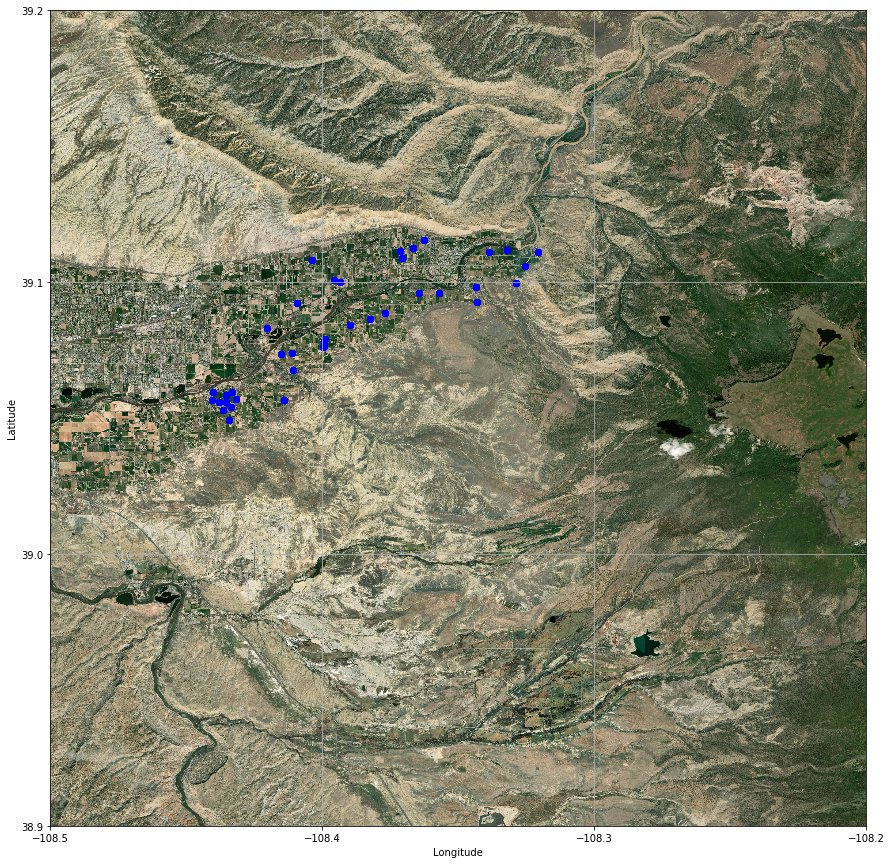

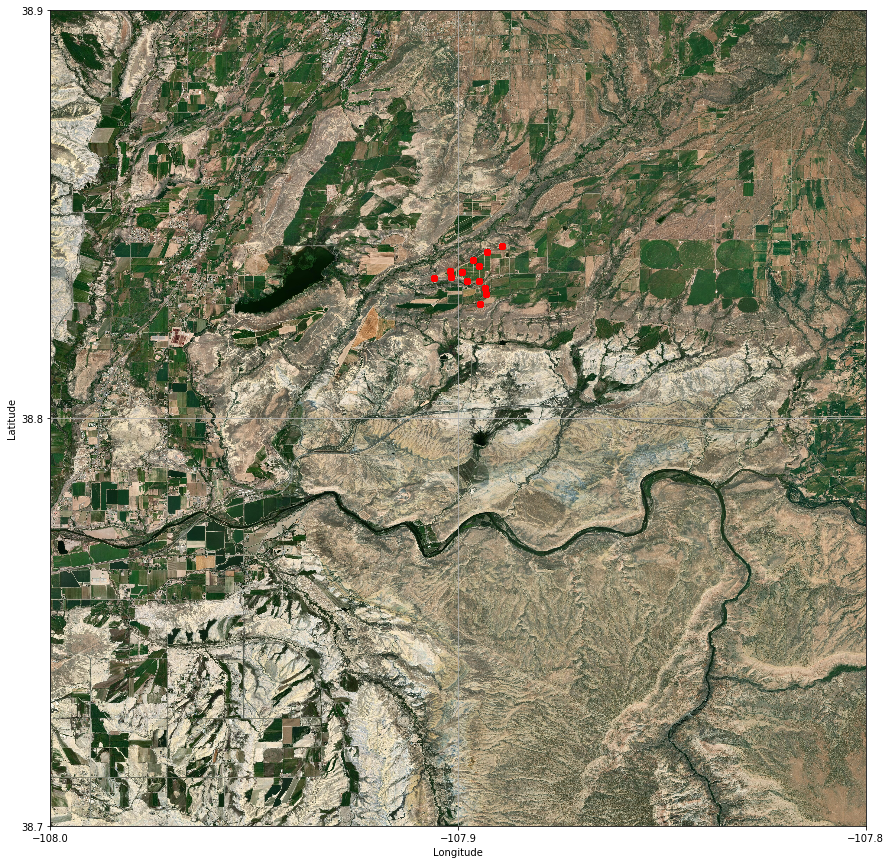

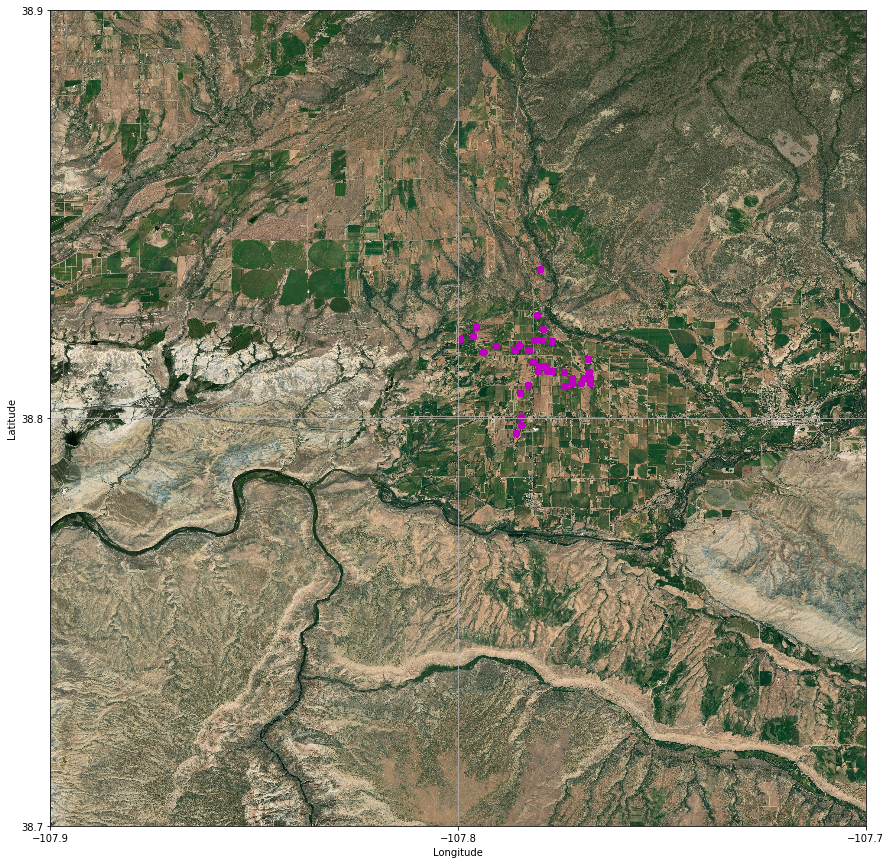

In [30]:
'''
In this part, different clusters are plotted separately.
For each cluster, minimum and maximums for longitude and latitude values for that cluster's members
are calculated above.

###WARNING: Resolution is increased for clusters, loading can take few minutes.

'''
#Plot first cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c1lon_st - 0.1, urcrnrlon=c1lon_en + 0.1, llcrnrlat=c1lat_st - 0.1, urcrnrlat=c1lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'World_Imagery', xpixels = 15000, dpi=1500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c1a[:,5], c1a[:,4], color='b')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c1lon_ticks)
plt.yticks(c1lat_ticks)
plt.grid()
plt.show()
#Plot second cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c2lon_st - 0.1, urcrnrlon=c2lon_en + 0.1, llcrnrlat=c2lat_st - 0.1, urcrnrlat=c2lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'World_Imagery', xpixels = 15000, dpi=1500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c2a[:,5], c2a[:,4], color='r')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c2lon_ticks)
plt.yticks(c2lat_ticks)
plt.grid()
plt.show()
#Plot third cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c3lon_st - 0.1, urcrnrlon=c3lon_en + 0.1, llcrnrlat=c3lat_st - 0.1, urcrnrlat=c3lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'World_Imagery', xpixels = 15000, dpi=1500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c3a[:,5], c3a[:,4], color='m')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c3lon_ticks)
plt.yticks(c3lat_ticks)
plt.grid()
plt.show()

In [22]:
'''Takes 15-20 minutes
Group measurements in the dataset that share the same id.
Create a list that contains all measurement times for one specific censor.
Write information in a file (also store it in a list "d").
    1-ID
    2-Number of measurements with same id
    3-First and last measurement of the censor
    4-Active time of the censor (in dataset)
'''
#Get the unique id's in the dataset to list "a"
a = np.unique(data.iloc[:,0], return_counts=False)
#f is a text file, for storing information
f = open('./data/time.txt', 'w')
#All datapoints' timestamps are grouped by id and stored in the list "d" 
d = []
#Iterate over unique ids
for i in range(len(a)):
    #Datapoints are stored in this list
    _read = []
    #Iterate over all datapoints
    for j in range(len(data)):
        #Is the id equal to the one in the iteration?
        if str(data.iloc[j,0]) == str(a[i]):
            #Save the datapoint's timestamp
            _read.append(datetime.utcfromtimestamp(int(data.iloc[j,1])))
    #If censor has more than one measurement (to be safe)
    if len(_read) > 1:
        #Find first and last measurement
        min_d, max_d = min(_read), max(_read)
        f.write("ID = %s\n" % a[i])
        f.write("Number of measurements taken: %s\n" % str(len(_read)))
        f.write("First measurements for censor: %s\n" % str(min_d))
        f.write("Last measurements for censor: %s\n" % str(max_d))
        f.write("Time between first and last measurement: %s\n\n" % str(max_d - min_d))
    d.append(_read)
f.close()

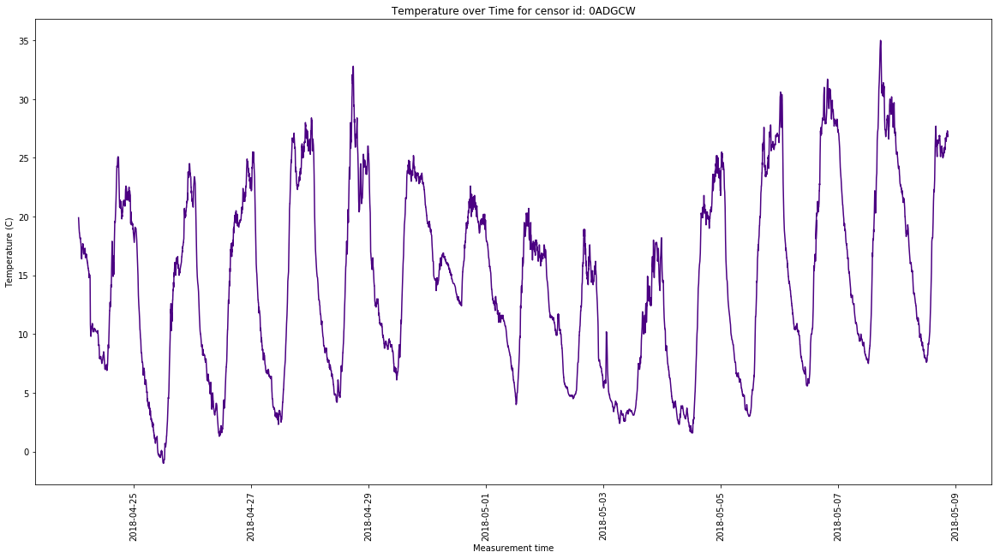

In [48]:
'''Experimental'''
#Plot temperature - time for one censor
#a = np.unique(data.iloc[:,0], return_counts=False)
#Obtain temperatures and measurement time for specific censor; id = 0ADGCW
tmp = data.loc[data['id'] == "0ADGCW", ['temp_celsius','timestamp']]
#Convert to datetime objects
_time = [datetime.utcfromtimestamp(int(i)) for i in tmp['timestamp']]
#Bar plot with time on x-axis and temperature (celsius) on y-axis
plt.figure(figsize=(20,10))
plt.plot(_time, tmp['temp_celsius'], color='indigo')
plt.title("Temperature over Time for censor id: %s" % a[2])
plt.xlabel("Measurement time")
plt.ylabel("Temperature (C)")
plt.xticks(rotation=90)
plt.show()

In [37]:
#Minus zero temperatures, are they really there?
negs = [i for i in _temp if i<0]
print(len(negs))

23


Would it be meaningful if we cluster by first measurement (when censor start working)?  
Why all the measurements are taken in spring 2018? Are there more measurements we can use (ex. a measurement from september 2018)?  
Would plotting temp-time for all unique ids be useful?